In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!pip install tensorflow==2.13.1

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 479.7/479.7 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 55.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 47.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 440.8/440.8 kB 28.0 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.12.2
    Uninstalling typing_extensions-4.12.2:
      Successfully uninstalled typing_extensions-4.12.2
  Attempting uninstall: numpy
    Found existing installation: numpy 1.26.4
    Uninstalling numpy-1.26.4:
      Successfully uninstalled numpy-1.26.4
  Attempting uninstall: keras
    Found existing installation: keras 3.4.1
    Uninstalling keras-3.4.1:
      Successfully uninstalled keras-3.4.1
  Attempting uninstall: gast
    Found existing installation: gast 0.6.0
    Uninstalling gast-0.6.0:
      

# **Data Preparation**

**Count Total Number of Images in the Directory**

In [1]:
import os

# Chemin vers le répertoire cible
Target_path = "/content/drive/MyDrive/Colab Notebooks/data4"

# Fonction pour compter les fichiers d'image dans un répertoire
def count_images_in_directory(directory, valid_extensions=['.jpg', '.jpeg', '.png']):
    count = 0
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                count += 1
    return count

# Compter les images dans le répertoire cible
total_images_count = count_images_in_directory(Target_path)
print(f"Nombre total d'images dans '{Target_path}' : {total_images_count}")


Nombre total d'images dans '/content/drive/MyDrive/Colab Notebooks/data4' : 1797


**List Subdirectories (Classes) and Count Images for Each Class**

In [2]:
# Obtenir la liste des sous-répertoires (classes)
class_dirs = [os.path.join(Target_path, class_name) for class_name in os.listdir(Target_path)
              if os.path.isdir(os.path.join(Target_path, class_name))]

# Compter les images pour chaque classe
for class_dir in class_dirs:
    class_name = os.path.basename(class_dir)
    class_image_count = count_images_in_directory(class_dir)
    print(f"Nombre d'images pour la classe '{class_name}' : {class_image_count}")


Nombre d'images pour la classe 'engagement' : 485
Nombre d'images pour la classe 'boredom' : 456
Nombre d'images pour la classe 'confusion' : 440
Nombre d'images pour la classe 'frustration' : 416


**Image Quality Assessment**

In [ ]:
import cv2
import os

def is_blurry(image_path, threshold=100):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        return False
    laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
    return laplacian_var < threshold

def check_image_quality(directory, resolution_threshold=(100, 100)):
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                # Check resolution
                image = cv2.imread(file_path)
                if image is None:
                    print(f"Image non chargée: {file_path}")
                    continue

                height, width, _ = image.shape
                if height < resolution_threshold[0] or width < resolution_threshold[1]:
                    print(f"Image avec résolution insuffisante: {file_path} ({width}x{height})")

                # Check blurriness
                if is_blurry(file_path):
                    print(f"Image floue détectée: {file_path}")

# Chemin vers le répertoire des images
check_image_quality(Target_path)


**Count the Number of Blurry Imagestexte en gras**

In [ ]:
def count_blurry_images(directory, threshold=100):
    blurry_count = 0
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                if is_blurry(file_path, threshold):
                    blurry_count += 1
                    print(f"Image floue détectée: {file_path}")
    return blurry_count

# Chemin vers le répertoire des images
blurry_image_count = count_blurry_images(Target_path)
print(f"Nombre total d'images floues : {blurry_image_count}")


Nombre total d'images floues : 0


**Enhance Blurry Images**

In [ ]:
from PIL import Image, ImageFilter
import os

def sharpen_image(image_path):
    image = Image.open(image_path)
    sharpened_image = image.filter(ImageFilter.SHARPEN)
    return sharpened_image

def process_blurry_images(directory, threshold=100):
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                if is_blurry(file_path, threshold):
                    print(f"Amélioration de l'image floue: {file_path}")
                    sharpened_image = sharpen_image(file_path)
                    sharpened_image.save(file_path)  # Remplacez l'image originale par l'image améliorée

# Chemin vers le répertoire des images
process_blurry_images(Target_path)


**Visualize Images Before and After Enhancement**

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

def visualize_images_before_after(image_path, sharpened_image):
    # Ouvrir l'image d'origine
    original_image = Image.open(image_path)

    # Afficher l'image d'origine et l'image améliorée côte à côte
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))
    axes[0].imshow(original_image)
    axes[0].set_title("Avant amélioration")
    axes[0].axis('off')

    axes[1].imshow(sharpened_image)
    axes[1].set_title("Après amélioration")
    axes[1].axis('off')

    plt.show()

def process_and_visualize_images(directory, threshold=100):
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                if is_blurry(file_path, threshold):
                    sharpened_image = sharpen_image(file_path)
                    visualize_images_before_after(file_path, sharpened_image)
                    sharpened_image.save(file_path)  # Remplacez l'image originale par l'image améliorée

# Chemin vers le répertoire des images
process_and_visualize_images(Target_path)


**Count Blurry Images After Enhancement**

In [ ]:
def count_blurry_images_after_enhancement(directory, threshold=100):
    blurry_count = 0
    valid_extensions = ['.jpg', '.jpeg', '.png']
    for root, dirs, files in os.walk(directory):
        for file in files:
            if any(file.lower().endswith(ext) for ext in valid_extensions):
                file_path = os.path.join(root, file)
                if is_blurry(file_path, threshold):
                    blurry_count += 1
                    print(f"Image toujours floue détectée après amélioration: {file_path}")
    return blurry_count

# Compter les images floues après l'amélioration
blurry_image_count_after = count_blurry_images_after_enhancement(Target_path)
print(f"Nombre total d'images toujours floues après amélioration : {blurry_image_count_after}")


Nombre total d'images toujours floues après amélioration : 0


**Split the Dataset into Training, Validation, and Test Sets**

In [3]:
import os
import numpy as np
from sklearn.model_selection import train_test_split

# Chemin vers le répertoire principal contenant vos images classées
data_dir = "/content/drive/MyDrive/Colab Notebooks/data4"

# Dictionnaire pour stocker les chemins d'images par classe
data = {'class_names': [], 'image_paths': []}

# Parcourir les classes et collecter les chemins des images
for class_name in os.listdir(data_dir):
    class_dir = os.path.join(data_dir, class_name)
    if os.path.isdir(class_dir):
        image_paths = [os.path.join(class_dir, img) for img in os.listdir(class_dir)]
        data['class_names'].extend([class_name] * len(image_paths))
        data['image_paths'].extend(image_paths)

# Convertir les listes en tableaux NumPy pour faciliter le split
class_names = np.array(data['class_names'])
image_paths = np.array(data['image_paths'])

# Diviser les données en ensembles d'entraînement, de validation et de test
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    image_paths, class_names, train_size=0.7, random_state=42, stratify=class_names
)

val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths, temp_labels, train_size=0.5, random_state=42, stratify=temp_labels
)

# Exemples d'utilisation des ensembles split :
# Utilisez train_paths, val_paths, test_paths dans votre modèle

print(f"Nombre d'images pour l'entraînement: {len(train_paths)}")
print(f"Nombre d'images pour la validation: {len(val_paths)}")
print(f"Nombre d'images pour le test: {len(test_paths)}")

Nombre d'images pour l'entraînement: 1257
Nombre d'images pour la validation: 270
Nombre d'images pour le test: 270


**Count Images by Class in Each Set**

In [4]:
from collections import Counter

# Chemin vers le répertoire principal contenant vos images classées


# Comptage des images par classe pour chaque ensemble
def count_images_by_class(labels):
    return dict(Counter(labels))

# Comptage des images par classe
train_counts = count_images_by_class(train_labels)
val_counts = count_images_by_class(val_labels)
test_counts = count_images_by_class(test_labels)

# Afficher les résultats
print("Comptage des images par classe:")
print("Ensemble d'entraînement:", train_counts)
print("Ensemble de validation:", val_counts)
print("Ensemble de test:", test_counts)


Comptage des images par classe:
Ensemble d'entraînement: {'boredom': 319, 'confusion': 308, 'frustration': 291, 'engagement': 339}
Ensemble de validation: {'engagement': 73, 'frustration': 63, 'confusion': 66, 'boredom': 68}
Ensemble de test: {'engagement': 73, 'frustration': 62, 'boredom': 69, 'confusion': 66}


In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Prétraitement des images pour générer preprocced_image_paths
preprocced_image_paths = [path.replace("data2", "preprocessed_data2") for path in data['image_paths']]

# Création des variables pour l'analyse
labels = np.array(data['class_names'])
image_paths = np.array(data['image_paths'])


/content/drive/MyDrive/Colab Notebooks/data4/confusion/4000221016_last_frame.jpg
/content/drive/MyDrive/Colab Notebooks/data4/confusion/4000221016_last_frame.jpg
        label                                              image  \
0  engagement  /content/drive/MyDrive/Colab Notebooks/data4/e...   
1     boredom  /content/drive/MyDrive/Colab Notebooks/data4/b...   
2   confusion  /content/drive/MyDrive/Colab Notebooks/data4/c...   
3   confusion  /content/drive/MyDrive/Colab Notebooks/data4/c...   
4  engagement  /content/drive/MyDrive/Colab Notebooks/data4/e...   

                                   preproccesd_image  
0  /content/drive/MyDrive/Colab Notebooks/data4/e...  
1  /content/drive/MyDrive/Colab Notebooks/data4/b...  
2  /content/drive/MyDrive/Colab Notebooks/data4/c...  
3  /content/drive/MyDrive/Colab Notebooks/data4/c...  
4  /content/drive/MyDrive/Colab Notebooks/data4/e...  
Distribution des classes pour l'ensemble Ensemble Complet :
label
engagement     485
boredom       

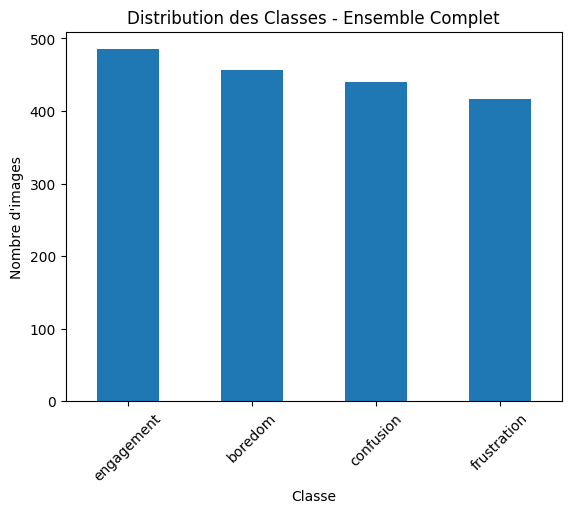

In [6]:
# Ajustement des listes pour qu'elles aient la même longueur
min_length = min(len(labels), len(image_paths), len(preprocced_image_paths))
labels = labels[:min_length]
image_paths = image_paths[:min_length]
preprocced_image_paths = preprocced_image_paths[:min_length]

# Création du DataFrame
dataset = pd.DataFrame()
dataset["label"] = labels
dataset["image"] = image_paths
dataset["preproccesd_image"] = preprocced_image_paths

# Mélange du DataFrame et réinitialisation des index
dataset = dataset.sample(frac=1).reset_index(drop=True)

# Affichage de certains éléments pour vérification
print(dataset["image"][3])
print(dataset['preproccesd_image'][3])

# Affichage des premières lignes du DataFrame
print(dataset.head())

# Vérification de la distribution des classes
def check_class_distribution(df, set_name):
    print(f"Distribution des classes pour l'ensemble {set_name} :")
    distribution = df['label'].value_counts()
    print(distribution)
    print("-" * 40)
    return distribution

# Vérifiez la distribution des classes
distribution = check_class_distribution(dataset, 'Ensemble Complet')

# Visualisation de la distribution
def plot_distribution(distribution, title):
    distribution.plot(kind='bar')
    plt.title(title)
    plt.xlabel('Classe')
    plt.ylabel('Nombre d\'images')
    plt.xticks(rotation=45)
    plt.show()

# Visualiser la distribution
plot_distribution(distribution, 'Distribution des Classes - Ensemble Complet')


<ipython-input-7-ea815d492adc>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')


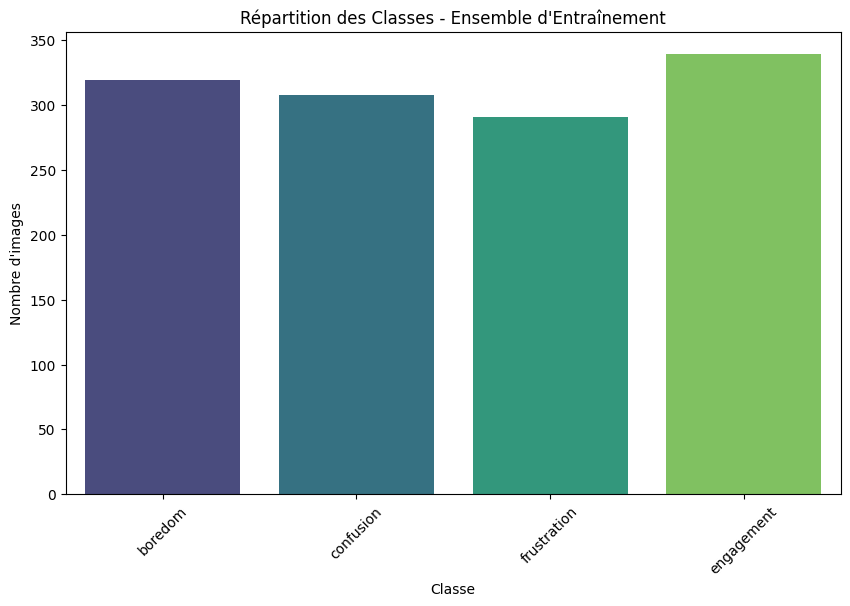

<ipython-input-7-ea815d492adc>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')


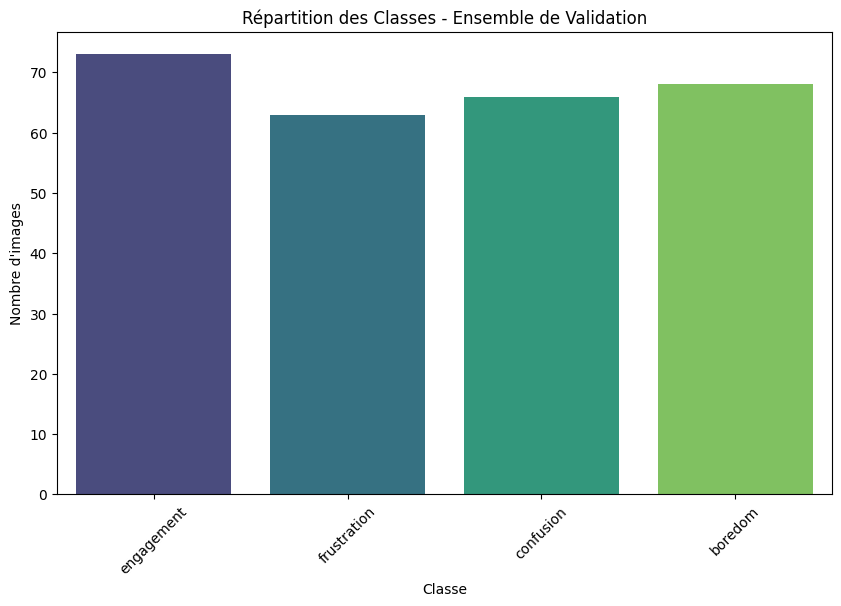

<ipython-input-7-ea815d492adc>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')


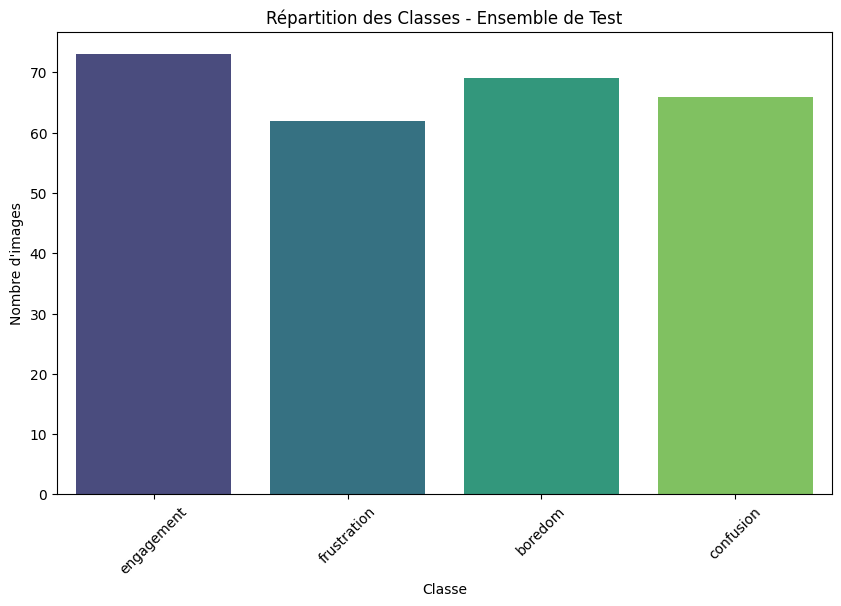

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Fonction pour visualiser la répartition des classes
def plot_class_distribution(counts, title):
    plt.figure(figsize=(10, 6))
    sns.barplot(x=list(counts.keys()), y=list(counts.values()), palette='viridis')
    plt.title(title)
    plt.xlabel('Classe')
    plt.ylabel('Nombre d\'images')
    plt.xticks(rotation=45)
    plt.show()

# Visualiser la répartition des classes dans chaque ensemble
plot_class_distribution(train_counts, 'Répartition des Classes - Ensemble d\'Entraînement')
plot_class_distribution(val_counts, 'Répartition des Classes - Ensemble de Validation')
plot_class_distribution(test_counts, 'Répartition des Classes - Ensemble de Test')


In [8]:
dataset = pd.DataFrame()
dataset["label"],dataset["image"],dataset['preproccesd_image']= labels,image_paths,preprocced_image_paths
dataset = dataset.sample(frac=1).reset_index(drop=True)
print(dataset["image"][3])
print(dataset['preproccesd_image'][3])
dataset.head()

/content/drive/MyDrive/Colab Notebooks/data4/boredom/1100142027_frame0.jpg
/content/drive/MyDrive/Colab Notebooks/data4/boredom/1100142027_frame0.jpg


,label,image,preproccesd_image
0,engagement,/content/drive/MyDrive/Colab Notebooks/data4/e...,/content/drive/MyDrive/Colab Notebooks/data4/e...
1,frustration,/content/drive/MyDrive/Colab Notebooks/data4/f...,/content/drive/MyDrive/Colab Notebooks/data4/f...
2,engagement,/content/drive/MyDrive/Colab Notebooks/data4/e...,/content/drive/MyDrive/Colab Notebooks/data4/e...
3,boredom,/content/drive/MyDrive/Colab Notebooks/data4/b...,/content/drive/MyDrive/Colab Notebooks/data4/b...
4,boredom,/content/drive/MyDrive/Colab Notebooks/data4/b...,/content/drive/MyDrive/Colab Notebooks/data4/b...


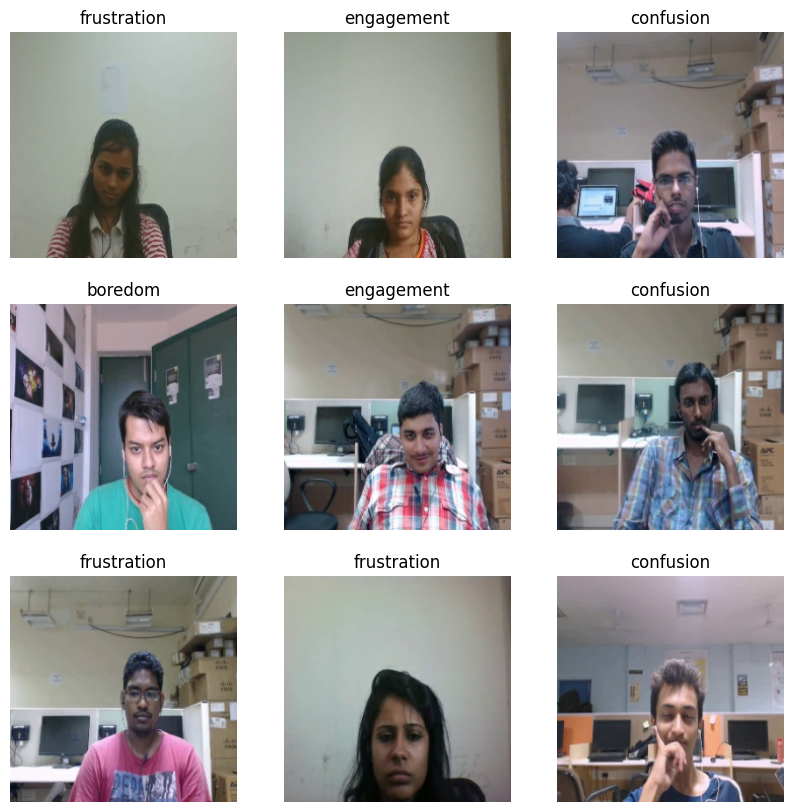

In [9]:
import tensorflow as tf
import matplotlib.pyplot as plt

# Paramètres pour le chargement des images
IMG_SIZE = (224, 224)  # Taille des images à laquelle elles seront redimensionnées
BATCH_SIZE = 32

# Fonction pour charger et prétraiter les images
def load_and_preprocess_image(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)  # Décodage de l'image JPEG
    img = tf.image.resize(img, IMG_SIZE)  # Redimensionnement de l'image
    img = img / 255.0  # Normalisation de l'image
    return img

# Fonction pour charger les données
def load_dataset(image_paths, labels):
    path_ds = tf.data.Dataset.from_tensor_slices(image_paths)
    label_ds = tf.data.Dataset.from_tensor_slices(labels)
    image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = tf.data.Dataset.zip((image_ds, label_ds))
    dataset = dataset.shuffle(buffer_size=len(image_paths))
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
    return dataset

# Chargement des ensembles d'entraînement, de validation et de test
train_dataset = load_dataset(train_paths, train_labels)
val_dataset = load_dataset(val_paths, val_labels)
test_dataset = load_dataset(test_paths, test_labels)

# Visualisation de quelques exemples d'images
for images, labels in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.title(labels[i].numpy().decode('utf-8'))
        plt.axis('off')
    plt.show()


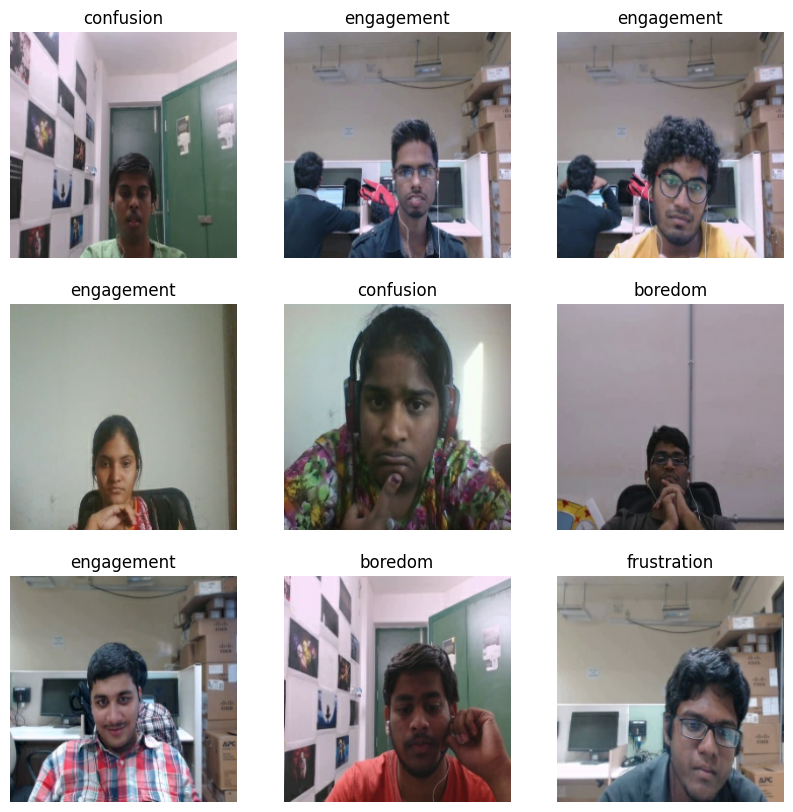

In [10]:
# Visualisation de quelques exemples d'images
for images, labels in train_dataset.take(1):
    plt.figure(figsize=(10, 10))
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.title(labels[i].numpy().decode('utf-8'))
        plt.axis('off')
    plt.show()


Vérification du jeu d'entraînement :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)
Vérification du jeu de validation :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)
Vérification du jeu de test :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)
Vérification du dataset combiné :
Taille des images: (32, 224, 224, 3)
Taille des labels: (32,)


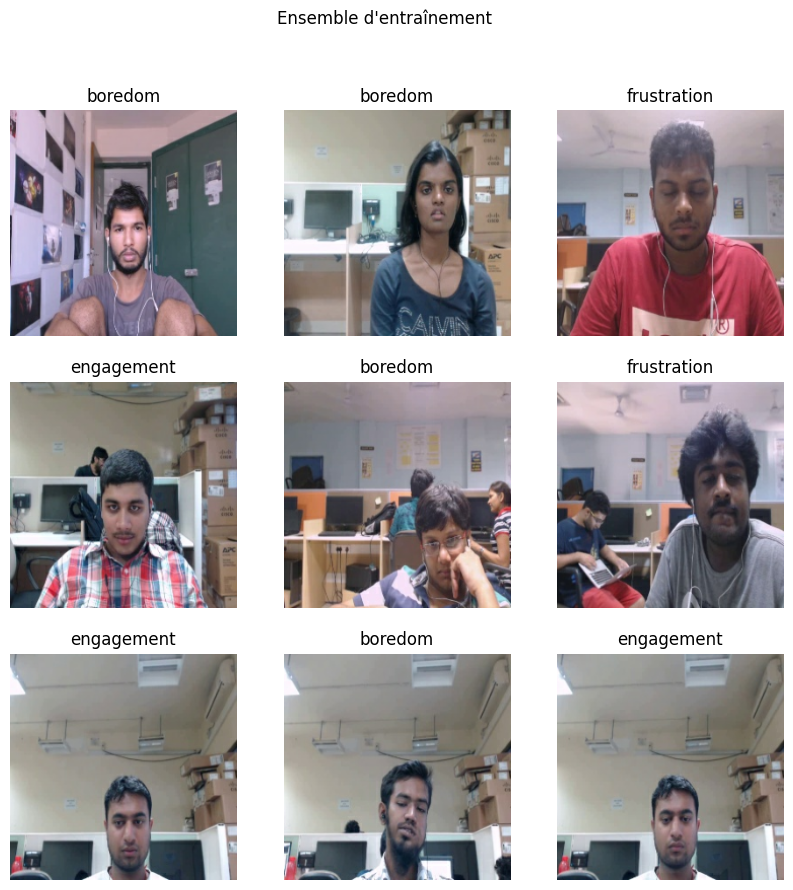

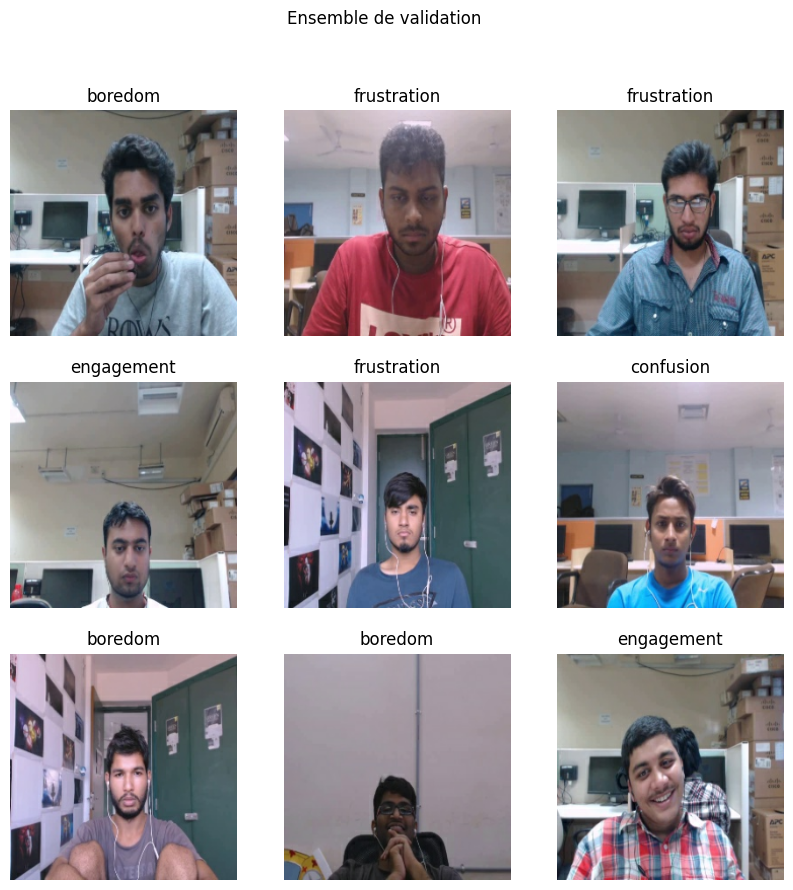

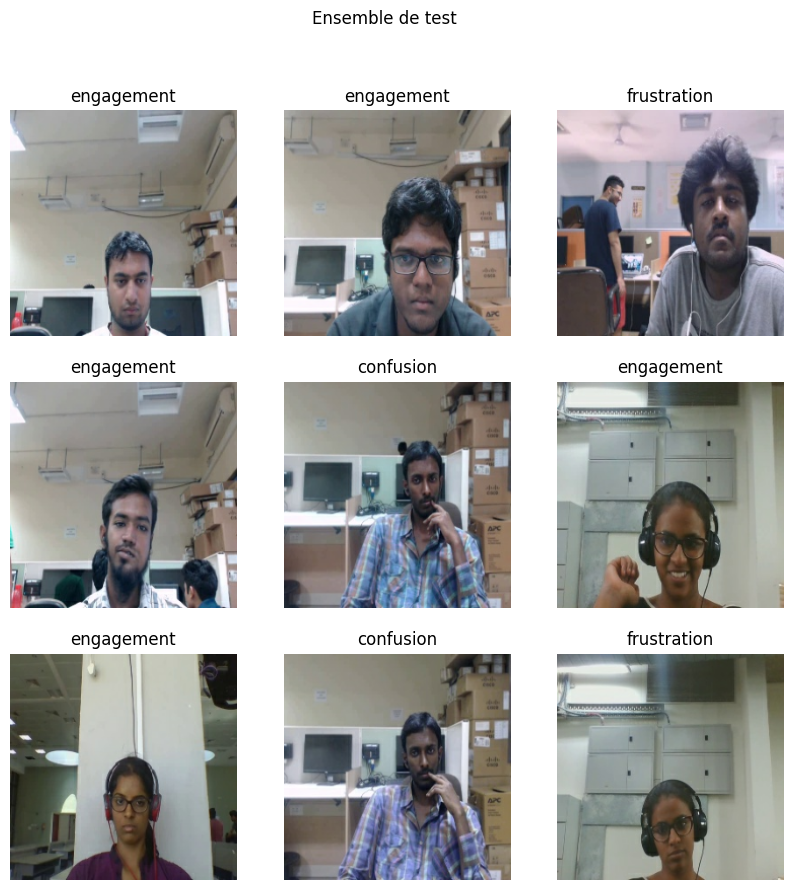

In [11]:
# Fonction pour vérifier la consistance des images et labels
def verify_dataset(dataset):
    for images, labels in dataset.take(1):
        print(f"Taille des images: {images.shape}")
        print(f"Taille des labels: {labels.shape}")

# Combinez les datasets pour une vérification générale
combined_dataset = train_dataset.concatenate(val_dataset).concatenate(test_dataset)

# Vérification des datasets individuels
print("Vérification du jeu d'entraînement :")
verify_dataset(train_dataset)

print("Vérification du jeu de validation :")
verify_dataset(val_dataset)

print("Vérification du jeu de test :")
verify_dataset(test_dataset)

# Vérification du dataset combiné
print("Vérification du dataset combiné :")
verify_dataset(combined_dataset)

# Visualisation des images pour chaque ensemble
def visualize_dataset(dataset, title=""):
    plt.figure(figsize=(10, 10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i])
            plt.title(labels[i].numpy().decode('utf-8'))
            plt.axis("off")
    plt.suptitle(title)
    plt.show()

# Visualisation des ensembles
visualize_dataset(train_dataset, "Ensemble d'entraînement")
visualize_dataset(val_dataset, "Ensemble de validation")
visualize_dataset(test_dataset, "Ensemble de test")


La forme minimale des images est : [256, 256, 3]


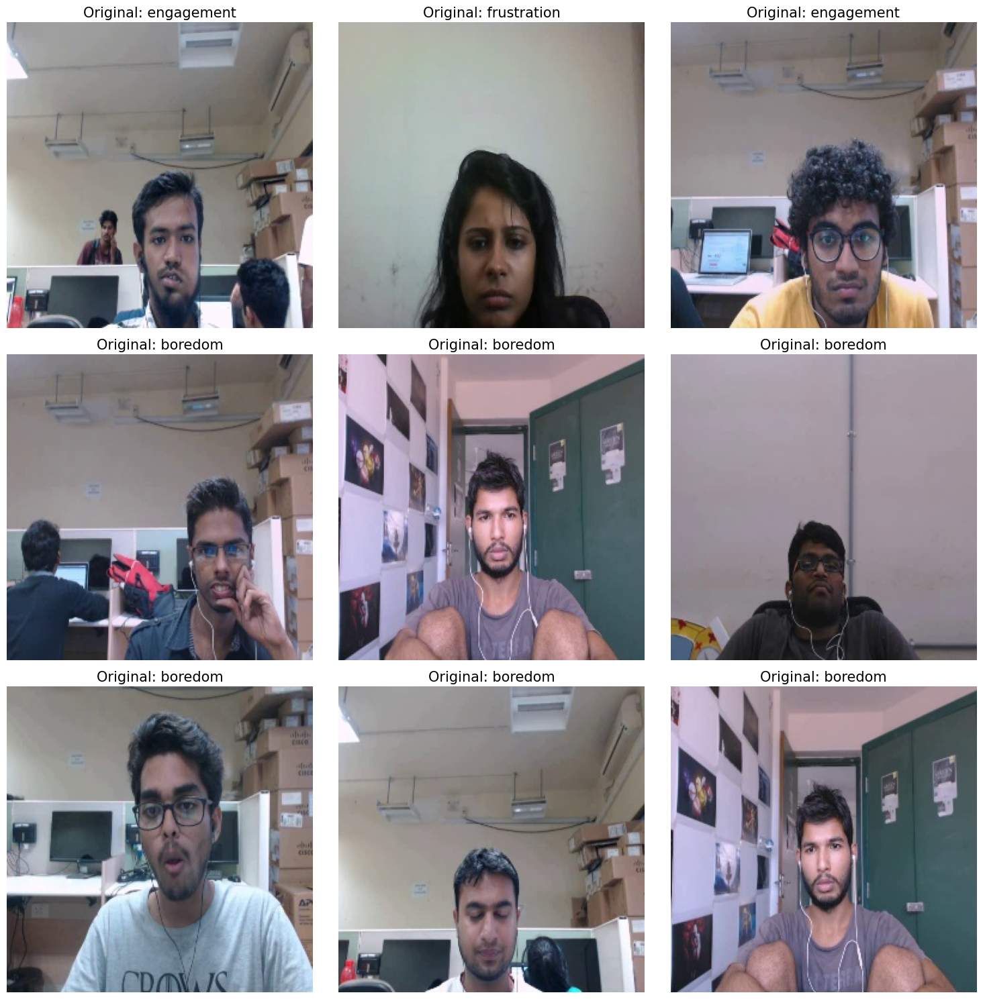

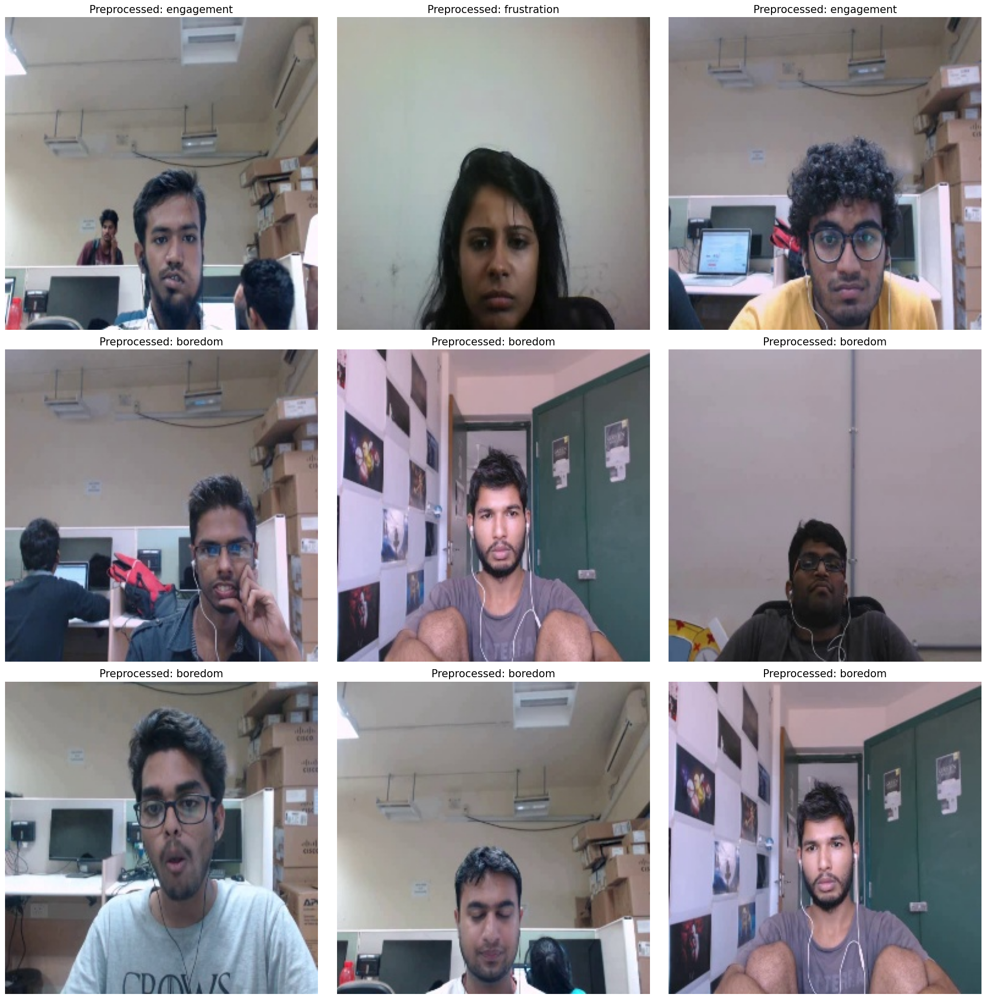

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

# Supposons que vous avez déjà le DataFrame 'dataset'
# Exemple : dataset = pd.DataFrame({'label': labels, 'image': image_paths, 'preproccesd_image': preprocessed_image_paths})

# Fonction pour charger les images avec PIL
def load_img(file_path):
    try:
        img = Image.open(file_path)
        return img
    except Exception as e:
        print(f"Erreur lors du chargement de l'image {file_path}: {e}")
        return Image.new('RGB', (22, 256))  # Retourner une image vide en cas d'erreur

# 1. Calculer la forme minimale (facultatif, en fonction de vos besoins)
def min_shape(image_paths):
    min_shape = [np.inf, np.inf, 3]
    for path in image_paths:
        img = Image.open(path)
        img = np.array(img)
        for index, shape in enumerate(img.shape):
            if img.shape[index] <= min_shape[index]:
                min_shape[index] = img.shape[index]
    return min_shape

# Afficher la forme minimale (facultatif)
min_shape_value = min_shape(dataset['image'])  # ou dataset['preproccesd_image'] pour les images prétraitées
print(f"La forme minimale des images est : {min_shape_value}")

# 2. Affichage d'un échantillon d'images originales
plt.figure(figsize=(15, 15))
dataset_ = pd.DataFrame(zip(dataset['label'], dataset['image']), columns=['label', 'image'])
files = dataset_.iloc[0:9]

for index, (label, file_path) in enumerate(files.itertuples(index=False)):
    plt.subplot(3, 3, index + 1)
    img = load_img(file_path)
    img = np.array(img)
    plt.imshow(img)
    plt.title(f"Original: {label}", fontsize=15)
    plt.axis('off')

plt.tight_layout()
plt.show()

# 3. Affichage d'un échantillon d'images après prétraitement
plt.figure(figsize=(20, 20))
dataset_ = pd.DataFrame(zip(dataset['label'], dataset['preproccesd_image']), columns=['label', 'image'])
files = dataset_.iloc[0:9]

for index, (label, file_path) in enumerate(files.itertuples(index=False)):
    plt.subplot(3, 3, index + 1)
    img = load_img(file_path)
    img = np.array(img)
    plt.imshow(img)
    plt.title(f"Preprocessed: {label}", fontsize=15)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [13]:
from sklearn.preprocessing import LabelEncoder

# Créer un encodeur de labels
label_encoder = LabelEncoder()
train_labels_encoded = label_encoder.fit_transform(train_labels)
val_labels_encoded = label_encoder.transform(val_labels)
test_labels_encoded = label_encoder.transform(test_labels)

# Vérifiez que les labels encodés sont des entiers
print("Exemples de labels encodés:", train_labels_encoded[:5])


Exemples de labels encodés: [0 1 0 1 3]


In [14]:
def load_dataset(image_paths, labels_encoded):
    # Convertir les chemins d'images et les labels encodés en TensorFlow Datasets
    path_ds = tf.data.Dataset.from_tensor_slices(image_paths)
    label_ds = tf.data.Dataset.from_tensor_slices(labels_encoded)

    # Charger et prétraiter les images
    image_ds = path_ds.map(load_and_preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)

    # Associer les images avec les labels
    dataset = tf.data.Dataset.zip((image_ds, label_ds))

    # Mélanger et batcher les données
    dataset = dataset.shuffle(buffer_size=len(image_paths))
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

    return dataset

# Recréer les datasets avec les labels encodés
train_dataset = load_dataset(train_paths, train_labels_encoded)
val_dataset = load_dataset(val_paths, val_labels_encoded)
test_dataset = load_dataset(test_paths, test_labels_encoded)


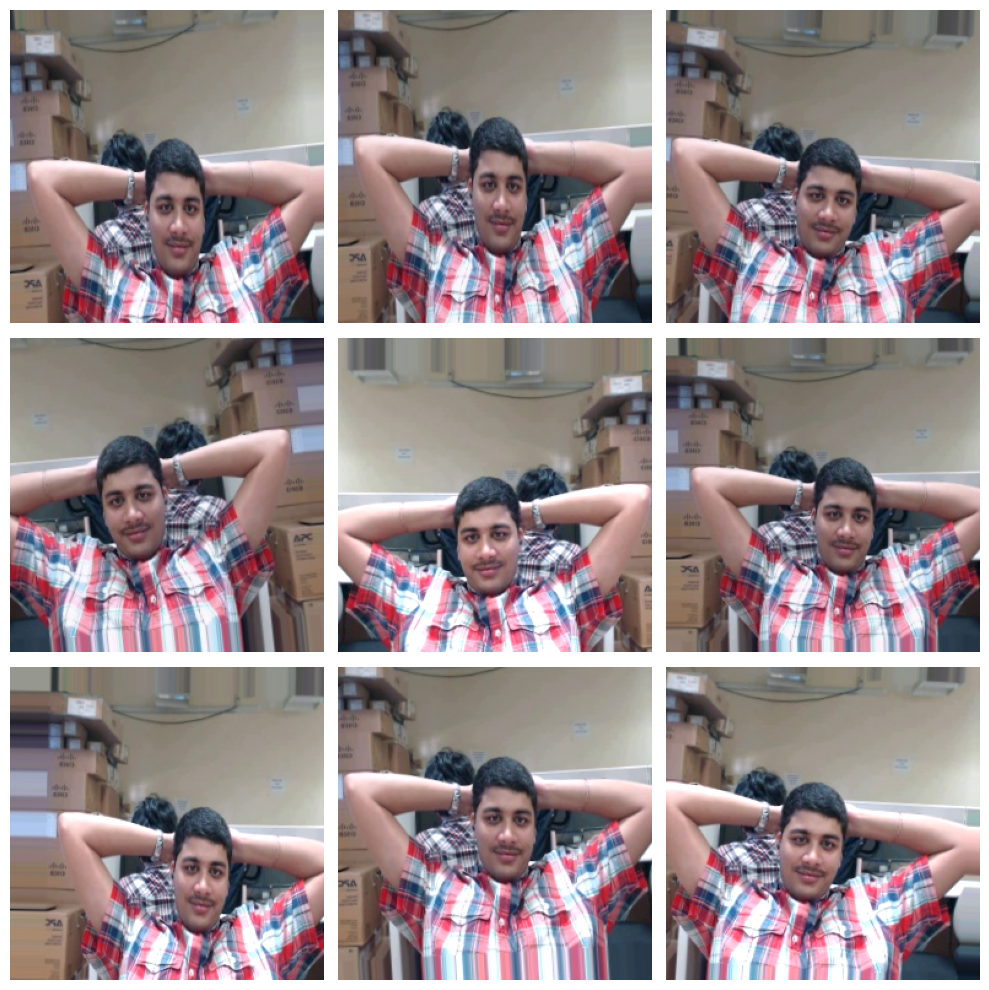

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img, load_img
import numpy as np

# Configuration de l'augmentation des données (comme dans votre code)
data_augmentation = ImageDataGenerator(
    rescale=1./255,  # Normalisation des images
    rotation_range=6,  # Rotation max de 6 degrés
    width_shift_range=0.09,  # Décalage horizontal
    height_shift_range=0.09,  # Décalage vertical
    shear_range=0.1,  # Cisaillement
    zoom_range=0.09,  # Zoom
    horizontal_flip=True,  # Flip horizontal
    brightness_range=[0.8, 1.2]  # Ajustement de la luminosité
)

# Charger l'image
image_path = "/content/drive/MyDrive/Colab Notebooks/data4/boredom/1100061027_frame0.jpg"  # Spécifiez le chemin de l'image
img = load_img(image_path, target_size=(256, 256))  # Charger et redimensionner l'image
img_array = img_to_array(img)  # Convertir en tableau NumPy (format requis pour Keras)
img_array = np.expand_dims(img_array, axis=0)  # Ajouter une dimension (pour simuler un batch)

# Appliquer l'augmentation sur l'image
augmented_images = data_augmentation.flow(img_array, batch_size=1)

# Générer et afficher quelques images augmentées
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))

# Générer 9 images augmentées
for i in range(9):
    plt.subplot(3, 3, i+1)

    # Obtenir une image augmentée
    aug_img = next(augmented_images)[0]  # Obtenir la première image du batch

    # Convertir en image affichable
    aug_img_display = array_to_img(aug_img)

    # Afficher l'image
    plt.imshow(aug_img_display)
    plt.axis('off')

plt.tight_layout()
plt.show()


In [18]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Configuration de l'augmentation des données
data_augmentation = ImageDataGenerator(
    rescale=1./255,  # Normalisation des images
    rotation_range=6,  # Rotation max de 6 degrés
    width_shift_range=0.09,  # Décalage horizontal
    height_shift_range=0.09,  # Décalage vertical
    shear_range=0.1,  # Cisaillement
    zoom_range=0.09,  # Zoom
    horizontal_flip=True,  # Flip horizontal
    brightness_range=[0.8, 1.2]  # Ajustement de la luminosité
)

# Appliquer l'augmentation sur le dataset d'entraînement
train_generator = data_augmentation.flow_from_directory(
    directory='/content/drive/MyDrive/Colab Notebooks/output/train',  # Chemin du dataset d'entraînement
    target_size=(256, 256),  # Taille de redimensionnement des images
    batch_size=32,
    class_mode='categorical'  # Si vos labels sont catégoriels (plusieurs classes)
)

# Pour les ensembles de validation et de test, on n'applique généralement pas l'augmentation.
val_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
    directory='/content/drive/MyDrive/Colab Notebooks/output/val',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)

test_generator = ImageDataGenerator(rescale=1./255).flow_from_directory(
    directory='/content/drive/MyDrive/Colab Notebooks/output/test',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical'
)


Found 1257 images belonging to 4 classes.
Found 270 images belonging to 4 classes.
Found 270 images belonging to 4 classes.


# **CNN**

In [20]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers
import time

# Définir les dimensions des images
img_size = (224, 224, 3) # Change the image size to match the actual input

# Construire le modèle avec les dimensions correctes
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=img_size),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(len(label_encoder.classes_), activation='softmax')  # Output layer
])

# Afficher le résumé du modèle pour vérifier les tailles
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │      11,075,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 11,169,476 (42.61 MB)

 Trainable params: 11,169,476 (42.61 MB)

 Non-trainable params: 0 (0.00 B)

In [21]:
# Compiler le modèle
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
start_time = time.time()  # Temps de début

# Entraîner le modèle
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=50
)

end_time = time.time()  # Temps de fin
training_time = end_time - start_time  # Calcul du temps d'entraînement
print(f"Temps d'entraînement : {training_time:.2f} secondes")

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 20s 217ms/step - accuracy: 0.3064 - loss: 2.3606 - val_accuracy: 0.5704 - val_loss: 1.0937
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.6116 - loss: 0.9984 - val_accuracy: 0.6704 - val_loss: 0.8801
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 6s 71ms/step - accuracy: 0.6919 - loss: 0.7564 - val_accuracy: 0.6741 - val_loss: 0.8391
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 72ms/step - accuracy: 0.7688 - loss: 0.6017 - val_accuracy: 0.7407 - val_loss: 0.7809
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 85ms/step - accuracy: 0.8029 - loss: 0.4980 - val_accuracy: 0.7037 - val_loss: 0.8464
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 81ms/step - accuracy: 0.8243 - loss: 0.4493 - val_accuracy: 0.7333 - val_loss: 0.9261
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 118ms/step - accuracy: 0.8674 - loss: 0.3277 - val_accuracy: 0.7148 - val_loss: 0.9044
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 115ms/step - accuracy: 0.8692 - loss: 0.3094 - val_accuracy: 0.69

In [22]:
from sklearn.metrics import classification_report
import numpy as np

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy pour classification_report
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Afficher le rapport de classification
print(classification_report(y_true, y_pred, target_names=['engagement', 'frustration', 'confusion', 'boredom']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 307ms/step
              precision    recall  f1-score   support

  engagement       0.73      0.80      0.76        69
 frustration       0.82      0.92      0.87        66
   confusion       0.85      0.64      0.73        73
     boredom       0.68      0.73      0.70        62

    accuracy                           0.77       270
   macro avg       0.77      0.77      0.77       270
weighted avg       0.78      0.77      0.77       270



1/1 [==============================] - 1s 501ms/step


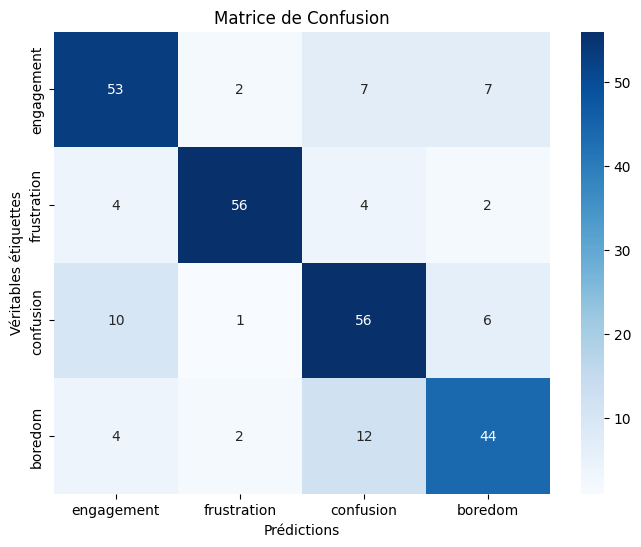

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred)

# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['engagement', 'frustration', 'confusion', 'boredom'],
            yticklabels=['engagement', 'frustration', 'confusion', 'boredom'])
plt.xlabel('Prédictions')
plt.ylabel('Véritables étiquettes')
plt.title('Matrice de Confusion')
plt.show()


9/9 - 14s - loss: 1.6939 - accuracy: 0.7741 - 14s/epoch - 2s/step
Précision sur les données de test : 77.41%


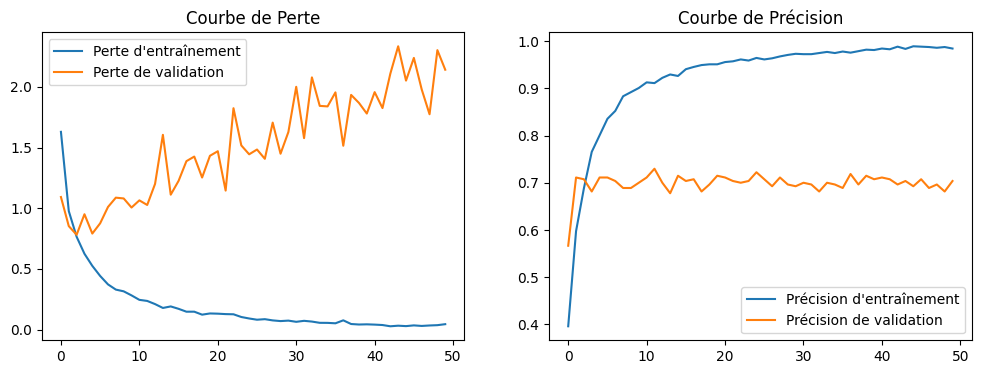

In [ ]:
# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model.evaluate(test_dataset, verbose=2)  # Use 'model' instead of 'model_cnn'

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Perte d\'entraînement')  # Use 'history' instead of 'history_cnn'
plt.plot(history.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Précision d\'entraînement')  # Use 'history'
plt.plot(history.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()

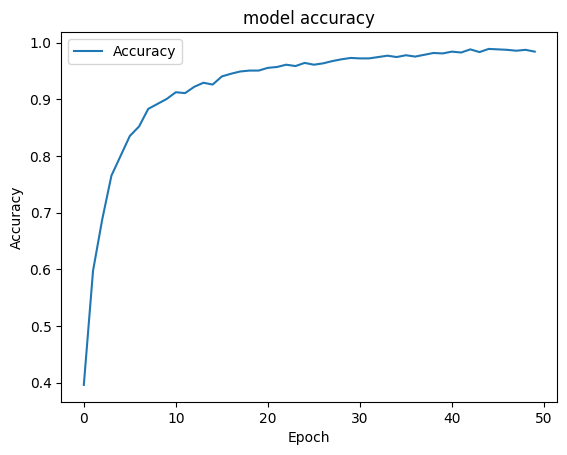

In [ ]:
plt.plot(history.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

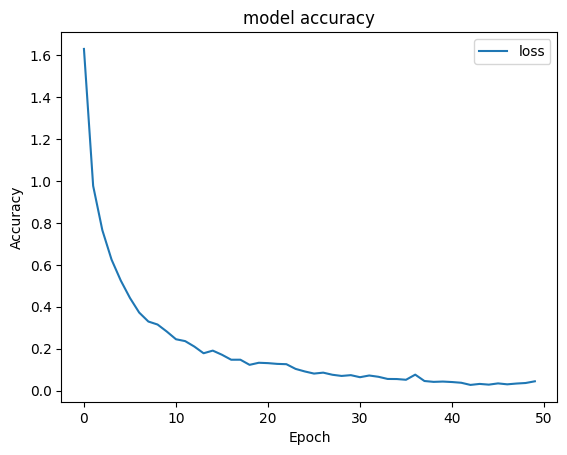

In [ ]:
plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [ ]:
history.history["accuracy"][-1]

0.9840890765190125

Original output: confusion
1/1 [==============================] - 0s 37ms/step
Predicted output: confusion


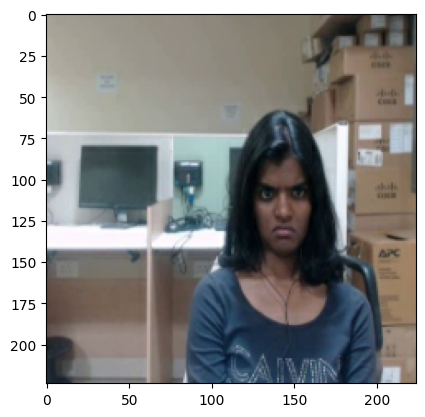

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Définir la taille des images (doit correspondre à celle utilisée lors de la création du modèle)
IMG_SIZE = (224, 224, 3)

# Convertir test_dataset en une liste d'images et de labels pour un accès plus facile
test_images = []
test_labels = []

for images, labels in test_dataset.unbatch():  # Unbatch pour accéder aux éléments individuellement
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_images))

# Afficher le label original
original_label = test_labels[image_index]
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
pred = model.predict(test_images[image_index].reshape(1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.show()


In [ ]:
# Chemin pour enregistrer le modèle dans Google Drive au format Keras
model_save_path = '/content/drive/MyDrive/Colab Notebooks/data4/cnn.keras'

# Enregistrer le modèle complet au format Keras
model.save(model_save_path, save_format='keras')


In [ ]:
# prompt: how to save the model

# Chemin pour enregistrer le modèle
model_save_path = '/content/drive/MyDrive/Colab Notebooks/data4/cnn.h5'

# Enregistrer le modèle
model.save(model_save_path)


In [ ]:
import os
import shutil
from pathlib import Path

# Chemins des répertoires de sortie
output_dir = "/content/drive/MyDrive/Colab Notebooks/output"
train_dir = os.path.join(output_dir, "train")
val_dir = os.path.join(output_dir, "val")
test_dir = os.path.join(output_dir, "test")

# Fonction pour copier les fichiers dans les répertoires cibles
def copy_files(file_paths, labels, target_dir):
    for file_path, label in zip(file_paths, labels):
        class_dir = os.path.join(target_dir, label)
        Path(class_dir).mkdir(parents=True, exist_ok=True)  # Crée le dossier de la classe s'il n'existe pas
        shutil.copy(file_path, class_dir)

# Copier les fichiers dans les répertoires d'entraînement, de validation et de test
copy_files(train_paths, train_labels, train_dir)
copy_files(val_paths, val_labels, val_dir)
copy_files(test_paths, test_labels, test_dir)

print("Les images ont été copiées avec succès dans les dossiers train, val et test.")


Les images ont été copiées avec succès dans les dossiers train, val et test.


# **transfert learning VGG16**

In [23]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator


In [24]:
data_dir = '/content/drive/MyDrive/Colab Notebooks/data4'

In [25]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Chemins pour les données
train_dir = '/content/drive/MyDrive/Colab Notebooks/output/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/output/val'
test_dir = '/content/drive/MyDrive/Colab Notebooks/output/test'

# Préparation des données sans prétraitement ni augmentation
train_datagen = ImageDataGenerator()  # Pas de rescale, pas d'augmentation
val_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # Taille attendue par VGG16
    batch_size=32,
    class_mode='categorical'  # Assurez-vous que vos labels sont one-hot encodés
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Nombre de classes
num_classes = len(train_generator.class_indices)

# Charger le modèle pré-entraîné VGG16 (sans les couches de classification)
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Ajouter des couches personnalisées pour la classification
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

Found 1257 images belonging to 4 classes.
Found 270 images belonging to 4 classes.
Found 270 images belonging to 4 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [27]:
# Créer le modèle complet
model_transfer = Model(inputs=base_model.input, outputs=predictions)

# Geler les couches du modèle VGG16 pour empêcher leur entraînement
for layer in base_model.layers:
    layer.trainable = False

# Compiler le modèle avec une fonction de perte, un optimiseur et des métriques
model_transfer.compile(optimizer='adam',
                      loss='categorical_crossentropy',
                      metrics=['accuracy'])


In [28]:
start_time = time.time()  # Temps de début

# Entraîner le modèle de transfert learning sur les données d'entraînement
epochs = 50

history_transfer = model_transfer.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator
)
end_time = time.time()

training_time = end_time - start_time  # Calcul du temps d'entraînement
print(f"Temps d'entraînement Transfert Learning : {training_time:.2f} secondes")


# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model_transfer.evaluate(test_generator, verbose=2)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')


Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 409s 8s/step - accuracy: 0.3940 - loss: 4.5716 - val_accuracy: 0.5704 - val_loss: 1.4831
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 43s 191ms/step - accuracy: 0.6012 - loss: 1.4971 - val_accuracy: 0.6556 - val_loss: 0.8355
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 179ms/step - accuracy: 0.6706 - loss: 0.8414 - val_accuracy: 0.7481 - val_loss: 0.7137
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - accuracy: 0.7060 - loss: 0.7333 - val_accuracy: 0.7556 - val_loss: 0.7065
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 224ms/step - accuracy: 0.7767 - loss: 0.6033 - val_accuracy: 0.7519 - val_loss: 0.6698
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - accuracy: 0.7637 - loss: 0.6108 - val_accuracy: 0.7444 - val_loss: 0.6874
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 190ms/step - accuracy: 0.7827 - loss: 0.5524 - val_accuracy: 0.7741 - val_loss: 0.6632
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 8s 169ms/step - accuracy: 0.7628 - loss: 0.5846 - val_accuracy: 0.7630 - va

9/9 ━━━━━━━━━━━━━━━━━━━━ 164s 17s/step


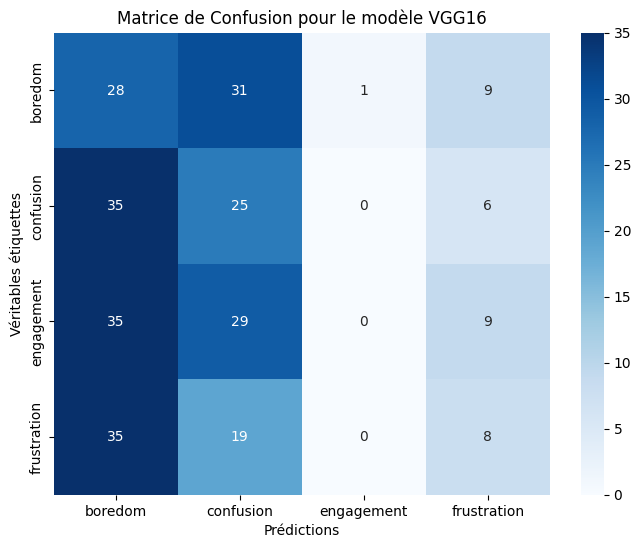

In [ ]:
# Importations nécessaires
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Obtenez les prédictions pour le dataset de test
y_true = test_generator.classes  # Les vraies étiquettes
y_pred = model.predict(test_generator)  # Prédictions du modèle
y_pred_classes = np.argmax(y_pred, axis=1)  # Convertir les prédictions en classes

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=list(test_generator.class_indices.keys()),
            yticklabels=list(test_generator.class_indices.keys()))
plt.xlabel('Prédictions')
plt.ylabel('Véritables étiquettes')
plt.title('Matrice de Confusion pour le modèle VGG16')
plt.show()


9/9 - 169s - 19s/step - accuracy: 0.7963 - loss: 0.6073
Précision sur les données de test : 79.63%


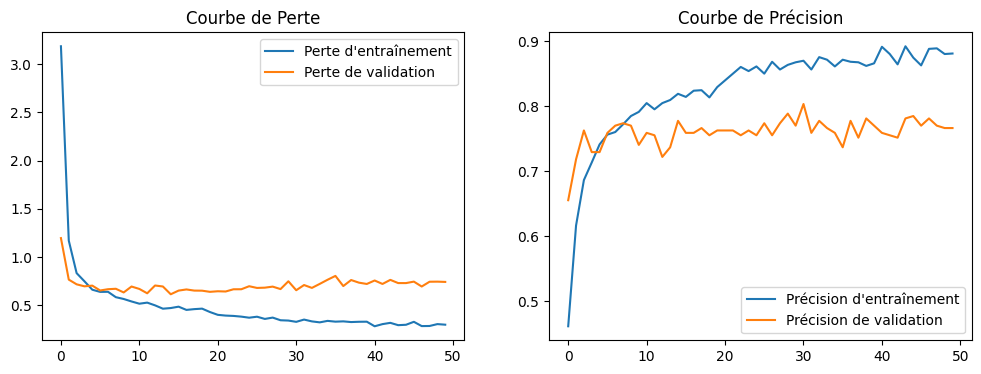

In [ ]:
# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model_transfer.evaluate(test_generator, verbose=2)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history_transfer.history['loss'], label='Perte d\'entraînement')  # Utiliser 'history_transfer'
plt.plot(history_transfer.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

plt.subplot(1, 2, 2)
plt.plot(history_transfer.history['accuracy'], label='Précision d\'entraînement')  # Utiliser 'history_transfer'
plt.plot(history_transfer.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assurez-vous que test_generator est correctement défini
# Pour chaque batch d'images dans test_generator, obtenez les prédictions
y_true = []
y_pred = []

# Parcourez le générateur de test manuellement
for i in range(len(test_generator)):
    images, labels = test_generator[i]  # Extraire les images et labels du générateur
    predictions = model_transfer.predict(images)  # Faire les prédictions
    y_true.extend(np.argmax(labels, axis=1))  # Convertir les labels one-hot en indices
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Afficher le rapport de classification
print(classification_report(y_true, y_pred, target_names=['engagement', 'frustration', 'confusion', 'boredom']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 20s 20s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 19s 19s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 18s 18s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
              precision    recall  f1-score   support

  engagement       0.84      0.84      0.84        69
 frustration       0.85      0.92      0.88        66
   confusion       0.74      0.78      0.76        73
     boredom       0.75      0.63      0.68        62

    accuracy                           0.80       270
   macro avg       0.79      0.79      0.79       270
weighted avg       0.79      0.80      0.79       270



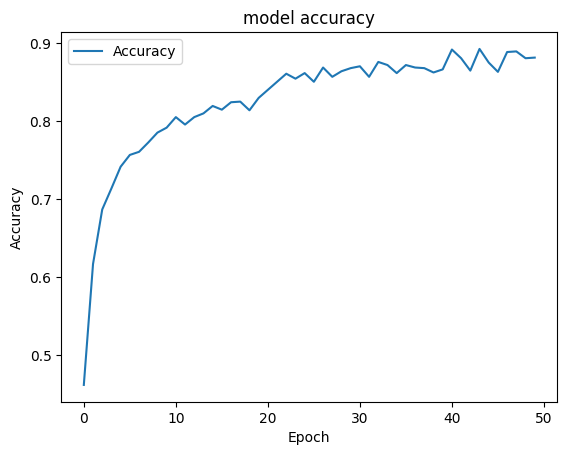

In [ ]:
plt.plot(history_transfer.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

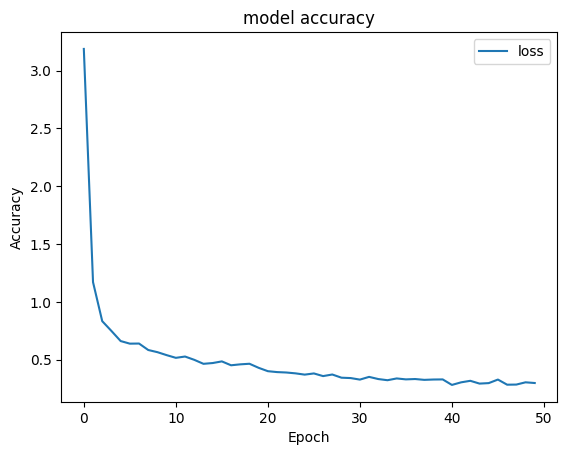

In [ ]:
plt.plot(history_transfer.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [ ]:
history_transfer.history["accuracy"][-1]

0.8814638257026672

Original output: frustration
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 770ms/step
Predicted output: engagement


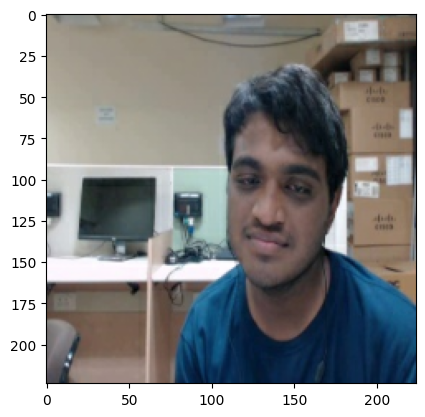

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Définir la taille des images (doit correspondre à celle utilisée lors de la création du modèle)
IMG_SIZE = (224, 224, 3)

# Convertir test_dataset en une liste d'images et de labels pour un accès plus facile
test_images = []
test_labels = []

for images, labels in test_dataset.unbatch():  # Unbatch pour accéder aux éléments individuellement
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_images))

# Afficher le label original
original_label = test_labels[image_index]
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
pred = model.predict(test_images[image_index].reshape(1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.show()


# **LSTM**

In [36]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping


In [37]:
# Configuration
img_height, img_width = 224, 224
batch_size = 32
num_classes = 4  # Change this according to your number of classes

# Prétraitement des données sans augmentation
datagen = ImageDataGenerator(rescale=1./255)
train_generator = datagen.flow_from_directory(
   '/content/drive/MyDrive/Colab Notebooks/output/train',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
val_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Colab Notebooks/output/val',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
test_generator = datagen.flow_from_directory(
    '/content/drive/MyDrive/Colab Notebooks/output/test',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 1257 images belonging to 4 classes.
Found 270 images belonging to 4 classes.
Found 270 images belonging to 4 classes.


In [38]:

# Définir le modèle CNN pour l'extraction des caractéristiques
def create_cnn_model(input_shape):
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
        MaxPooling2D((2, 2)),
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D((2, 2)),
        Flatten()
    ])
    return model

cnn_model = create_cnn_model((img_height, img_width, 3))



In [39]:
# Fonction pour extraire les caractéristiques à partir du CNN
def extract_features(generator, cnn_model):
    features = []
    labels = []
    for batch in generator:
        imgs, lbls = batch
        feats = cnn_model.predict(imgs)
        feats = np.reshape(feats, (feats.shape[0], -1, feats.shape[-1]))  # Reshape pour LSTM
        features.append(feats)
        labels.append(lbls)
        if len(features) * batch_size >= generator.samples:
            break
    return np.vstack(features), np.vstack(labels)

train_features, train_labels = extract_features(train_generator, cnn_model)
val_features, val_labels = extract_features(val_generator, cnn_model)
test_features, test_labels = extract_features(test_generator, cnn_model)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

In [41]:
# Définir le modèle LSTM
model_lstm = Sequential([
    LSTM(128, input_shape=train_features.shape[1:], return_sequences=False),
    Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

# Compiler le modèle
model_lstm.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Définir EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Entraîner le modèle
history_lstm = model_lstm.fit(
    train_features, train_labels,
    epochs=50,
    validation_data=(val_features, val_labels),
    callbacks=[early_stopping]
)

# Évaluer le modèle
test_loss, test_accuracy = model_lstm.evaluate(test_features, test_labels, verbose=2)
print(f'Précision sur les données de test (LSTM avec CNN) : {test_accuracy * 100:.2f}%')

Epoch 1/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 81ms/step - accuracy: 0.2630 - loss: 1.5255 - val_accuracy: 0.4185 - val_loss: 1.3248
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.3447 - loss: 1.3607 - val_accuracy: 0.4889 - val_loss: 1.2900
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 51ms/step - accuracy: 0.3803 - loss: 1.3130 - val_accuracy: 0.5259 - val_loss: 1.2587
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 50ms/step - accuracy: 0.3943 - loss: 1.2671 - val_accuracy: 0.5222 - val_loss: 1.2221
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - accuracy: 0.3943 - loss: 1.2765 - val_accuracy: 0.5444 - val_loss: 1.2326
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step - accuracy: 0.4471 - loss: 1.2596 - val_accuracy: 0.5815 - val_loss: 1.1983
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step - accuracy: 0.4641 - loss: 1.2107 - val_accuracy: 0.5815 - val_loss: 1.1939
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.4683 - loss: 1.2065 - val_accuracy: 0.6037 - v

In [42]:
print(f"Temps d'entraînement LSTM : {training_time:.2f} secondes")

Temps d'entraînement LSTM : 115.05 secondes


In [43]:
from sklearn.metrics import classification_report
import numpy as np

# Faire des prédictions sur les données de test
y_pred = model_lstm.predict(test_features)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(test_labels, axis=1)

# Obtenir les noms des classes
class_labels = list(test_generator.class_indices.keys())

# Afficher le rapport de classification
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print(report)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test (LSTM avec CNN) : {test_accuracy * 100:.2f}%')


9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
              precision    recall  f1-score   support

     boredom       0.88      0.65      0.75        69
   confusion       0.74      0.92      0.82        66
  engagement       0.69      0.78      0.73        73
 frustration       0.61      0.53      0.57        62

    accuracy                           0.73       270
   macro avg       0.73      0.72      0.72       270
weighted avg       0.73      0.73      0.72       270

Précision sur les données de test (LSTM avec CNN) : 72.59%


9/9 [==============================] - 1s 71ms/step


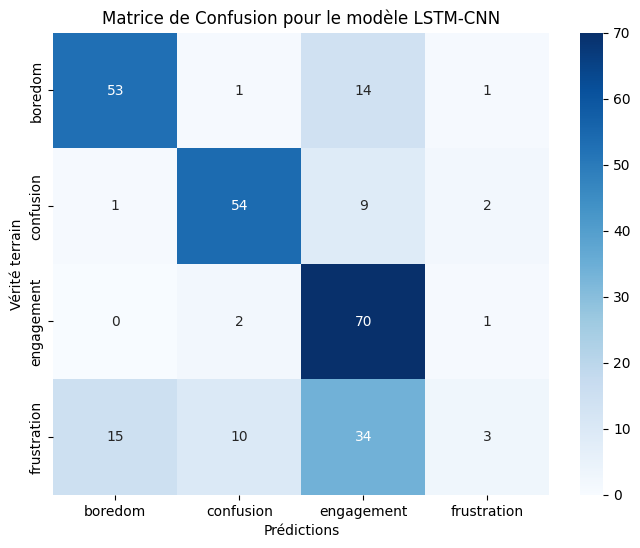

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Faire des prédictions sur les données de test
y_pred = model_lstm.predict(test_features)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(test_labels, axis=1)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred_classes)

# Afficher la matrice de confusion
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Prédictions')
plt.ylabel('Vérité terrain')
plt.title('Matrice de Confusion pour le modèle LSTM-CNN')
plt.show()


9/9 - 1s - loss: 1.0065 - accuracy: 0.6667 - 502ms/epoch - 56ms/step
Précision sur les données de test (LSTM-CNN) : 66.67%


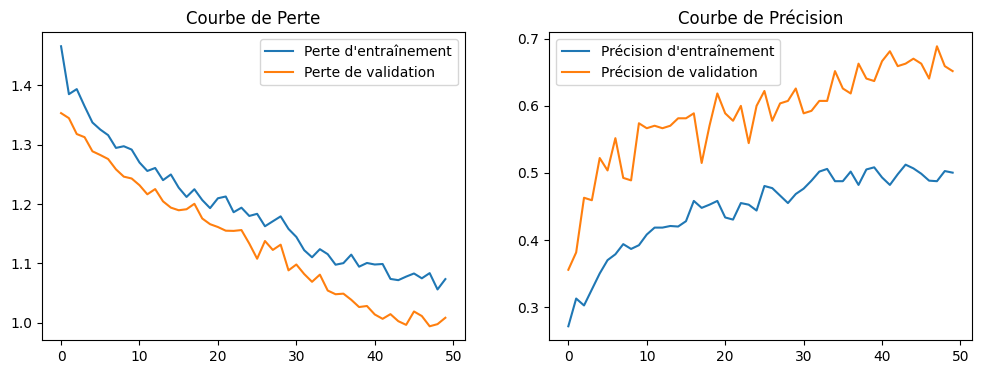

In [ ]:
import matplotlib.pyplot as plt

# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model_lstm.evaluate(test_features, test_labels, verbose=2)

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test (LSTM-CNN) : {test_accuracy * 100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))

# Courbe de perte
plt.subplot(1, 2, 1)
plt.plot(history_lstm.history['loss'], label='Perte d\'entraînement')
plt.plot(history_lstm.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

# Courbe de précision
plt.subplot(1, 2, 2)
plt.plot(history_lstm.history['accuracy'], label='Précision d\'entraînement')
plt.plot(history_lstm.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()


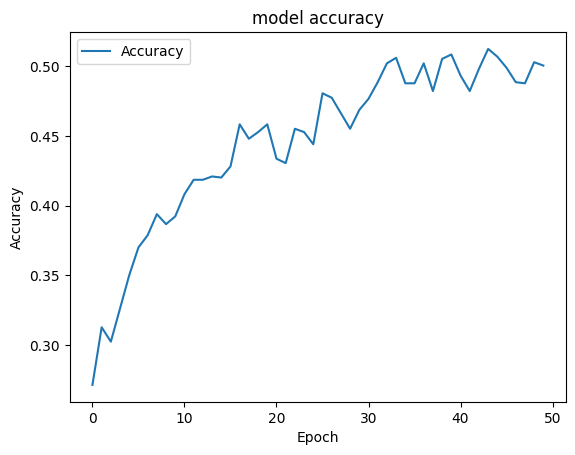

In [ ]:
plt.plot(history_lstm.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

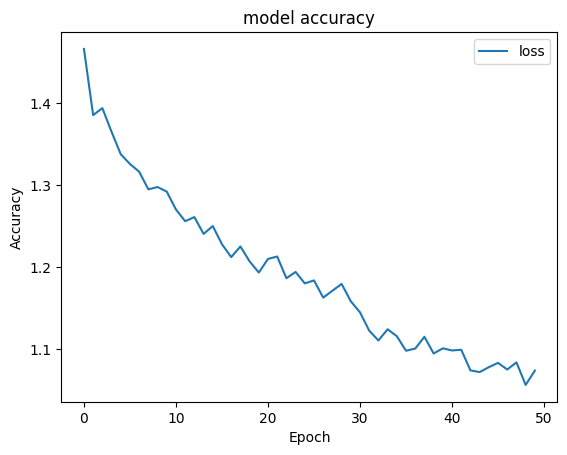

In [ ]:
plt.plot(history_lstm.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [ ]:
history_lstm.history["accuracy"][-1]

0.500397801399231

Original output: frustration
1/1 [==============================] - 0s 38ms/step
Predicted output: engagement


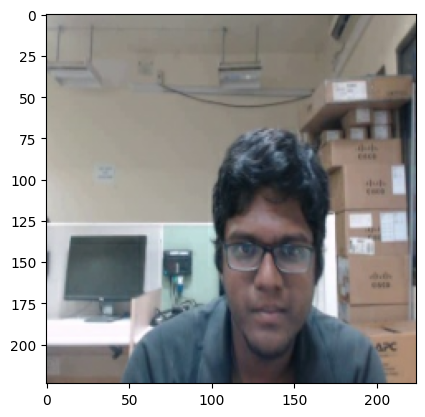

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Définir la taille des images (doit correspondre à celle utilisée lors de la création du modèle)
IMG_SIZE = (224, 224, 3)

# Convertir test_dataset en une liste d'images et de labels pour un accès plus facile
test_images = []
test_labels = []

for images, labels in test_dataset.unbatch():  # Unbatch pour accéder aux éléments individuellement
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_images))

# Afficher le label original
original_label = test_labels[image_index]
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
pred = model.predict(test_images[image_index].reshape(1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.show()


In [ ]:
# Exemple pour sauvegarder un modèle
model.save('/content/drive/MyDrive/Colab Notebooks/data4/model_lstm_cnn.keras', save_format='keras')

In [ ]:
# Sauvegarder le modèle LSTM-CNN
model_lstm.save('/content/drive/MyDrive/Colab Notebooks/data4/model_lstm_cnn.h5')

# Afficher un message de confirmation
print("Le modèle LSTM-CNN a été sauvegardé avec succès.")


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Le modèle LSTM-CNN a été sauvegardé avec succès.


In [ ]:
# Sauvegarder le modèle VGG16 de transfert learning
model_transfer.save('/content/drive/MyDrive/Colab Notebooks/data4/model_transfer_vgg16.h5')

# Afficher un message de confirmation
print("Le modèle de Transfert Learning VGG16 a été sauvegardé avec succès.")


Le modèle de Transfert Learning VGG16 a été sauvegardé avec succès.


In [45]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow import keras
import time

# Step 1: Préparation des données (assumant des images de 224x224)
train_dir = '/content/drive/MyDrive/Colab Notebooks/output/train'
val_dir = '/content/drive/MyDrive/Colab Notebooks/output/val'
test_dir = '/content/drive/MyDrive/Colab Notebooks/output/test'

train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),  # input size
    batch_size=32,
    class_mode='sparse'  # integer labels
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse'
)

# Step 2: Définir l'Embedding Positionnel et l'Encodeur Transformer
class PositionalEmbedding(layers.Layer):
    def __init__(self, num_patches, embed_dim):
        super().__init__()
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=embed_dim)

    def call(self, x):
        positions = tf.range(start=0, limit=num_patches, delta=1)
        embedded_positions = self.position_embedding(positions)
        return x + embedded_positions

class TransformerEncoder(layers.Layer):
    def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
        super().__init__(**kwargs)
        self.attention = layers.MultiHeadAttention(num_heads=num_heads, key_dim=embed_dim, dropout=0.3)
        self.dense_proj = keras.Sequential(
            [layers.Dense(dense_dim, activation=tf.nn.gelu),
             layers.Dense(embed_dim)]
        )
        self.layernorm_1 = layers.LayerNormalization()
        self.layernorm_2 = layers.LayerNormalization()

    def call(self, inputs, mask=None):
        if mask is not None:
            mask = mask[:, tf.newaxis, :]

        attention_output = self.attention(inputs, inputs, attention_mask=mask)
        proj_input = self.layernorm_1(inputs + attention_output)
        proj_output = self.dense_proj(proj_input)
        return self.layernorm_2(proj_input + proj_output)

# Step 3: Construire le modèle Transformer
def build_transformer_model(input_shape, num_patches, embed_dim, num_heads, dense_dim, num_classes):
    inputs = layers.Input(shape=input_shape)

    # Créer des patches et les embedder
    x = layers.Conv2D(filters=embed_dim, kernel_size=(16, 16), strides=(16, 16))(inputs)
    x = layers.Reshape((num_patches, embed_dim))(x)

    # Ajouter les embeddings positionnels
    x = PositionalEmbedding(num_patches, embed_dim)(x)

    # Appliquer l'encodeur Transformer
    x = TransformerEncoder(embed_dim, dense_dim, num_heads)(x)
    x = layers.GlobalAveragePooling1D()(x)

    # Couche de classification finale
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs)
    return model

# Step 4: Compiler et entraîner le modèle
image_size = 224  # Taille de l'image (224x224)
patch_size = 16    # Taille des patches (16x16)
num_patches = (image_size // patch_size) ** 2
embed_dim = 64
num_heads = 4
dense_dim = 128
num_classes = len(train_generator.class_indices)

model = build_transformer_model((image_size, image_size, 3), num_patches, embed_dim, num_heads, dense_dim, num_classes)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Mesurer le temps d'entraînement
start_time = time.time()

# Entraîner le modèle
epochs = 50
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=val_generator
)
end_time = time.time()  # Temps de fin
training_time = end_time - start_time  # Calcul du temps d'entraînement
print(f"Temps d'entraînement Transformer : {training_time:.2f} secondes")


# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model.evaluate(test_generator, verbose=2)
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')


Found 1257 images belonging to 4 classes.
Found 270 images belonging to 4 classes.
Found 270 images belonging to 4 classes.
Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 24s 362ms/step - accuracy: 0.2345 - loss: 2.1311 - val_accuracy: 0.2519 - val_loss: 1.4108
Epoch 2/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - accuracy: 0.2540 - loss: 1.4092 - val_accuracy: 0.2444 - val_loss: 1.4019
Epoch 3/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.2487 - loss: 1.3992 - val_accuracy: 0.2444 - val_loss: 1.3945
Epoch 4/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - accuracy: 0.2916 - loss: 1.3918 - val_accuracy: 0.2444 - val_loss: 1.4223
Epoch 5/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 143ms/step - accuracy: 0.2503 - loss: 1.4126 - val_accuracy: 0.2333 - val_loss: 1.3888
Epoch 6/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - accuracy: 0.2667 - loss: 1.3976 - val_accuracy: 0.2333 - val_loss: 1.3937
Epoch 7/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 10s 148ms/step - accuracy: 0.2600 - loss: 1.4110 - val_accuracy: 0.2444 - val_loss: 1.4003
Epoch 8/50
40/40 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - accuracy: 0.2483 - loss: 1.4057 - val_accuracy: 0.2704 - 

In [47]:
from sklearn.metrics import classification_report
import numpy as np

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy pour classification_report
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Afficher le rapport de classification
print(classification_report(y_true, y_pred, target_names=['engagement', 'frustration', 'confusion', 'boredom']))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
              precision    recall  f1-score   support

  engagement       0.65      0.77      0.71        69
 frustration       0.87      0.62      0.73        66
   confusion       0.58      0.74      0.65        73
     boredom       0.61      0.48      0.54        62

    accuracy                           0.66       270
   macro avg       0.68      0.65      0.66       270
weighted avg       0.68      0.66      0.66       270



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step


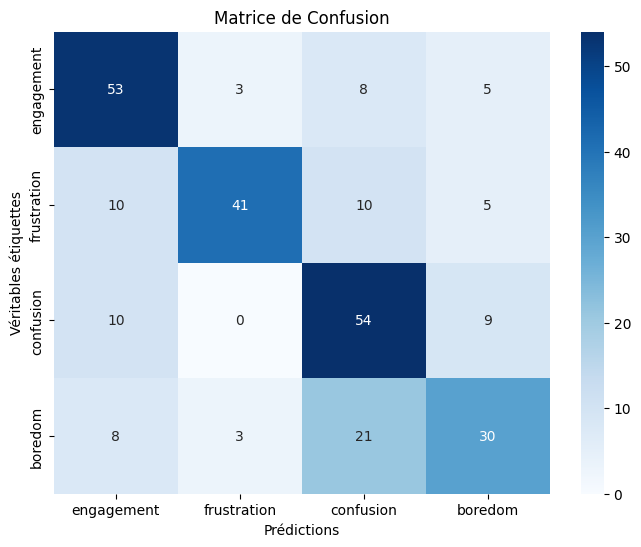

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Assurez-vous que test_dataset est correctement défini
# Pour chaque image dans test_dataset, obtenez les prédictions
y_true = []  # Les vraies étiquettes
y_pred = []  # Les prédictions du modèle

for images, labels in test_dataset:
    predictions = model.predict(images)  # Prédictions du modèle
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(predictions, axis=1))

# Convertir les listes en tableaux NumPy
y_true = np.array(y_true)
y_pred = np.array(y_pred)

# Calculer la matrice de confusion
conf_matrix = confusion_matrix(y_true, y_pred)

# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['engagement', 'frustration', 'confusion', 'boredom'],
            yticklabels=['engagement', 'frustration', 'confusion', 'boredom'])
plt.xlabel('Prédictions')
plt.ylabel('Véritables étiquettes')
plt.title('Matrice de Confusion')
plt.show()


9/9 - 5s - 543ms/step - accuracy: 0.6593 - loss: 1.3118
Précision sur les données de test : 65.93%


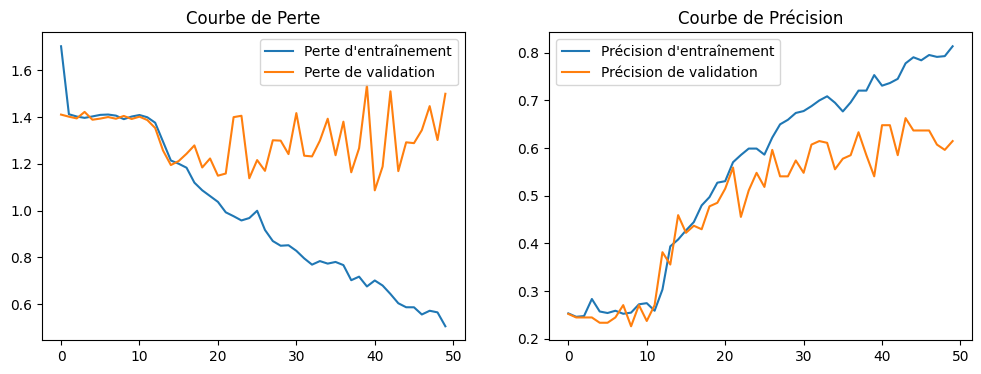

In [49]:
# Évaluation du modèle sur les données de test
test_loss, test_accuracy = model.evaluate(test_dataset, verbose=2)  # Use 'model' instead of 'model_cnn'

# Afficher la précision du modèle sur les données de test
print(f'Précision sur les données de test : {test_accuracy*100:.2f}%')

# Afficher les courbes d'apprentissage (perte et précision)
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Perte d\'entraînement')  # Use 'history' instead of 'history_cnn'
plt.plot(history.history['val_loss'], label='Perte de validation')
plt.legend()
plt.title('Courbe de Perte')

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Précision d\'entraînement')  # Use 'history'
plt.plot(history.history['val_accuracy'], label='Précision de validation')
plt.legend()
plt.title('Courbe de Précision')

plt.show()

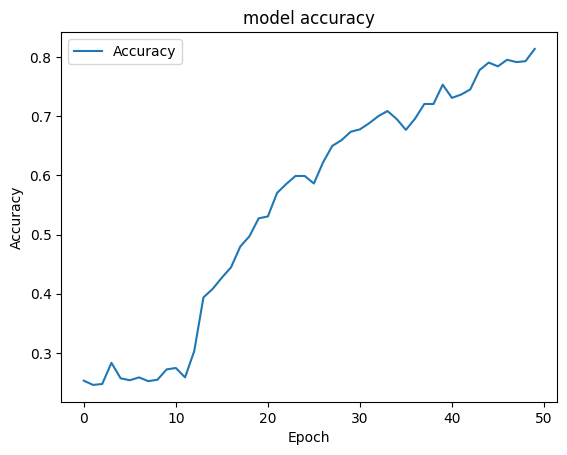

In [50]:
plt.plot(history.history["accuracy"])
# plt.plot(history.history['val_accuracy'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["Accuracy"])

plt.show()

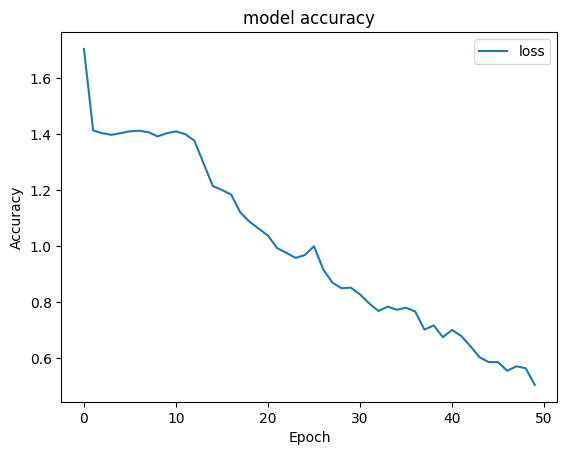

In [51]:
plt.plot(history.history['loss'])
# plt.plot(history.history['val_loss'])
plt.title("model accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(["loss"])
plt.show()

In [52]:
history.history["accuracy"][-1]

0.8138424754142761

Original output: confusion
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 976ms/step
Predicted output: confusion


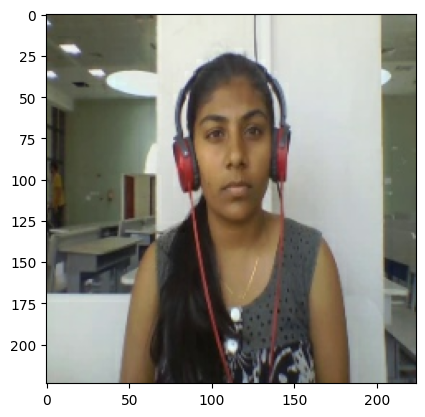

In [53]:
import numpy as np
import matplotlib.pyplot as plt

# Définir la taille des images (doit correspondre à celle utilisée lors de la création du modèle)
IMG_SIZE = (224, 224, 3)

# Convertir test_dataset en une liste d'images et de labels pour un accès plus facile
test_images = []
test_labels = []

for images, labels in test_dataset.unbatch():  # Unbatch pour accéder aux éléments individuellement
    test_images.append(images.numpy())
    test_labels.append(labels.numpy())

test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Choisir un index aléatoire pour une image dans le dataset de test
image_index = np.random.randint(0, len(test_images))

# Afficher le label original
original_label = test_labels[image_index]
print("Original output:", label_encoder.inverse_transform([original_label])[0])

# Faire une prédiction pour cette image
pred = model.predict(test_images[image_index].reshape(1, IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))

# Retourner le label de la classe prédite
prediction_label = label_encoder.inverse_transform([pred.argmax()])[0]
print("Predicted output:", prediction_label)

# Afficher l'image
plt.imshow(test_images[image_index].reshape(IMG_SIZE[0], IMG_SIZE[1], IMG_SIZE[2]))
plt.show()


In [54]:
# Chemin pour enregistrer le modèle dans Google Drive au format Keras
model_save_path = '/content/drive/MyDrive/Colab Notebooks/data4//transformer.keras'

# Enregistrer le modèle complet au format Keras
model.save(model_save_path, save_format='keras')


In [55]:
# prompt: how to save the model

# Chemin pour enregistrer le modèle
model_save_path = '/content/drive/MyDrive/Colab Notebooks/data4/transformer.h5'

# Enregistrer le modèle
model.save(model_save_path)


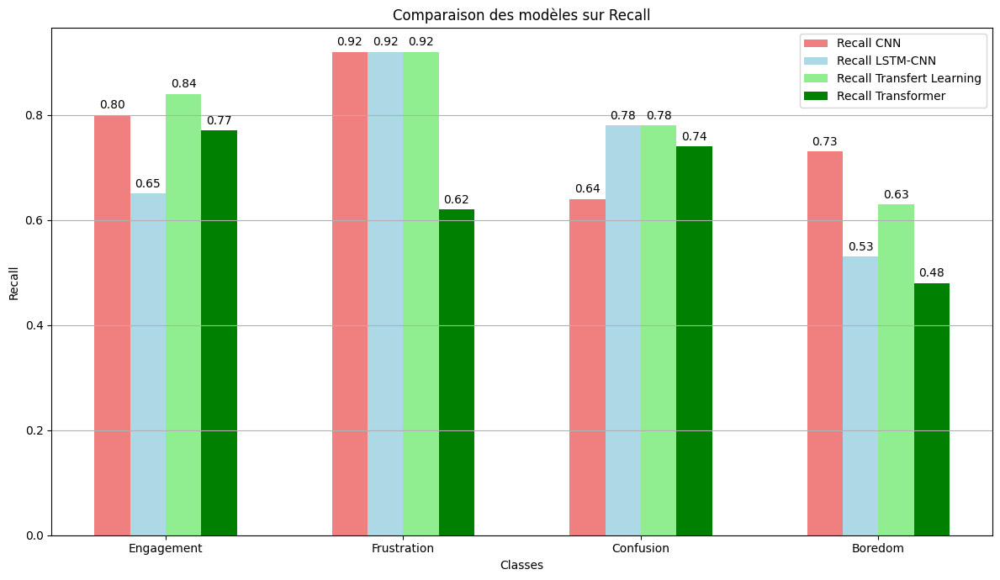

In [57]:
import numpy as np
import matplotlib.pyplot as plt

# Noms des classes
classes = ['Engagement', 'Frustration', 'Confusion', 'Boredom']

# Résultats pour chaque modèle (recall, f1-score, accuracy)
# CNN
recall_model1 = [0.80, 0.92, 0.64, 0.73]
f1_model1 = [0.76, 0.87, 0.73, 0.70]
accuracy_model1 = 0.77

# LSTM-CNN
recall_model2 = [0.65, 0.92, 0.78, 0.53]
f1_model2 = [0.75, 0.82, 0.73, 0.57]
accuracy_model2 = 0.73

# Transfert Learning VGG16
recall_model3 = [0.84, 0.92, 0.78, 0.63]
f1_model3 = [0.84, 0.88, 0.76, 0.68]
accuracy_model3 = 0.80

# Transformer
recall_model4 = [0.77, 0.62, 0.74, 0.48]
f1_model4 = [0.71, 0.73, 0.65, 0.54]
accuracy_model4 = 0.66

# Création de l'indice pour les barres
x = np.arange(len(classes))

# Largeur des barres
width = 0.15  # Ajuster la largeur pour accueillir tous les modèles

# --- Diagramme des Recall ---
fig, ax = plt.subplots(figsize=(12, 7))

# Affichage des barres pour Recall par classe et par modèle
rects1 = ax.bar(x - 1.5*width, recall_model1, width, label='Recall CNN', color='lightcoral')
rects2 = ax.bar(x - 0.5*width, recall_model2, width, label='Recall LSTM-CNN', color='lightblue')
rects3 = ax.bar(x + 0.5*width, recall_model3, width, label='Recall Transfert Learning', color='lightgreen')
rects4 = ax.bar(x + 1.5*width, recall_model4, width, label='Recall Transformer', color='green')

# Ajout des lignes de grille
ax.yaxis.grid(True)

# Ajuster les labels et titres pour le diagramme des Recall
ax.set_xlabel('Classes')
ax.set_ylabel('Recall')
ax.set_title('Comparaison des modèles sur Recall')
ax.set_xticks(x)
ax.set_xticklabels(classes)
ax.legend()

# Ajouter les valeurs au-dessus des barres
def add_value_labels(rects):
    """Ajoute des étiquettes de valeur au-dessus de chaque barre."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points au-dessus de la barre
                    textcoords='offset points',
                    ha='center', va='bottom')

add_value_labels(rects1)
add_value_labels(rects2)
add_value_labels(rects3)
add_value_labels(rects4)

plt.tight_layout()
plt.show()



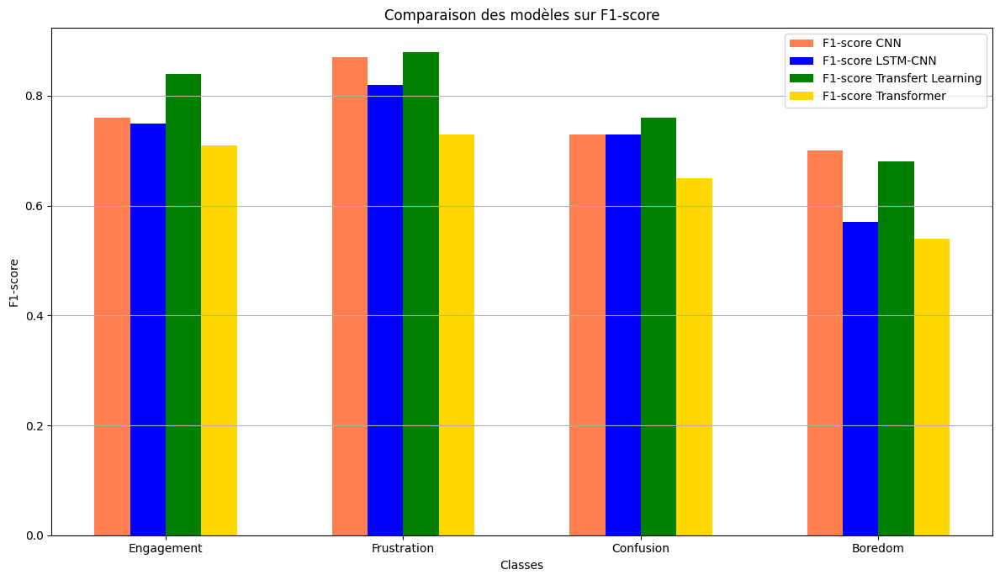

In [58]:
# --- Diagramme des F1-scores ---
fig2, ax2 = plt.subplots(figsize=(12, 7))

# Affichage des barres pour F1-score par classe et par modèle
rects5 = ax2.bar(x - 1.5*width, f1_model1, width, label='F1-score CNN', color='coral')
rects6 = ax2.bar(x - 0.5*width, f1_model2, width, label='F1-score LSTM-CNN', color='blue')
rects7 = ax2.bar(x + 0.5*width, f1_model3, width, label='F1-score Transfert Learning', color='green')
rects8 = ax2.bar(x + 1.5*width, f1_model4, width, label='F1-score Transformer', color='gold')

# Ajout des lignes de grille
ax2.yaxis.grid(True)

# Ajuster les labels et titres pour le diagramme des F1-scores
ax2.set_xlabel('Classes')
ax2.set_ylabel('F1-score')
ax2.set_title('Comparaison des modèles sur F1-score')
ax2.set_xticks(x)
ax2.set_xticklabels(classes)
ax2.legend()

# Ajouter les valeurs au-dessus des barres
add_value_labels(rects5)
add_value_labels(rects6)
add_value_labels(rects7)
add_value_labels(rects8)

plt.tight_layout()
plt.show()



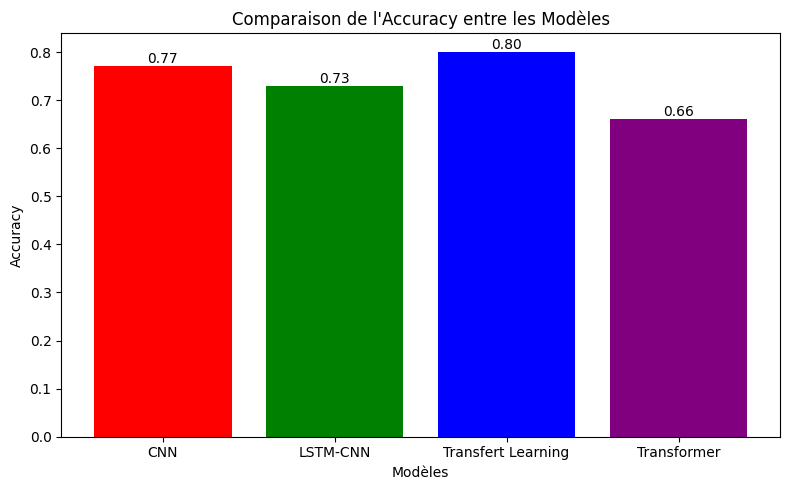

In [60]:
# --- Diagramme de l'Accuracy ---
model_names = ['CNN', 'LSTM-CNN', 'Transfert Learning', 'Transformer']
accuracy_values = [accuracy_model1, accuracy_model2, accuracy_model3, accuracy_model4]

fig3, ax3 = plt.subplots(figsize=(8, 5))
ax3.bar(model_names, accuracy_values, color=['red', 'green', 'blue', 'purple'])
ax3.set_xlabel('Modèles')
ax3.set_ylabel('Accuracy')
ax3.set_title('Comparaison de l\'Accuracy entre les Modèles')

# Ajouter les valeurs au-dessus des barres d'Accuracy
for i, value in enumerate(accuracy_values):
    ax3.text(i, value, f'{value:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()



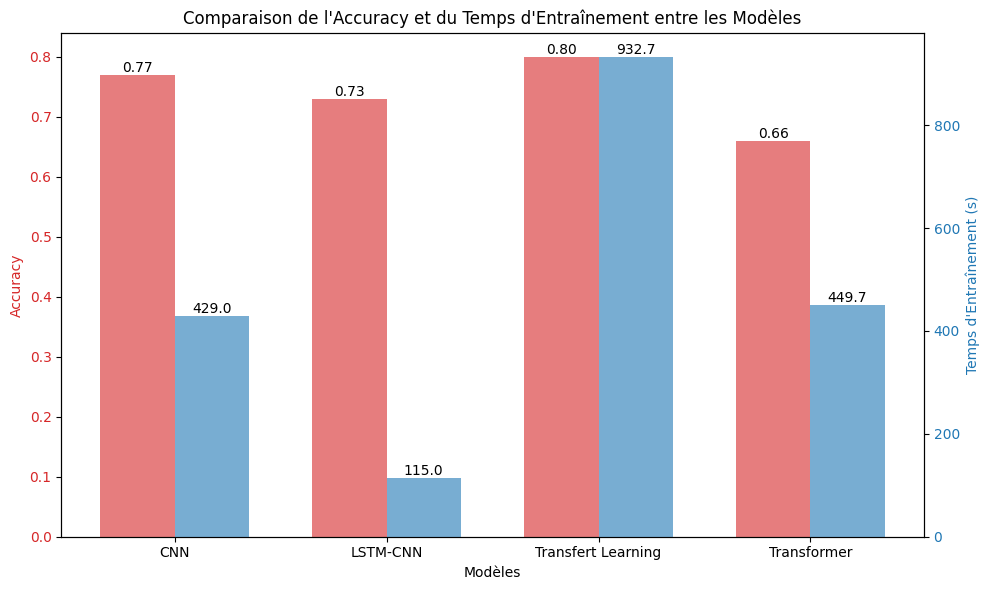

In [61]:
# --- Temps d'entraînement et Accuracy ---
training_times = [429.03, 115.05, 932.68, 449.69]  # Temps en secondes

fig4, ax4 = plt.subplots(figsize=(10, 6))
bar_width = 0.35
index = np.arange(len(model_names))

# Barres de l'Accuracy
bars1 = ax4.bar(index, accuracy_values, bar_width, label='Accuracy', color='tab:red', alpha=0.6)
ax4.set_ylabel('Accuracy', color='tab:red')
ax4.tick_params(axis='y', labelcolor='tab:red')

# Ajouter les valeurs au-dessus des barres d'Accuracy
for bar in bars1:
    yval = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom')

# Barres de Temps d'entraînement
ax5 = ax4.twinx()
bars2 = ax5.bar(index + bar_width, training_times, bar_width, label='Temps d\'Entraînement (s)', color='tab:blue', alpha=0.6)
ax5.set_ylabel('Temps d\'Entraînement (s)', color='tab:blue')
ax5.tick_params(axis='y', labelcolor='tab:blue')

# Ajouter les valeurs au-dessus des barres de Temps d'entraînement
for bar in bars2:
    yval = bar.get_height()
    ax5.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.1f}', ha='center', va='bottom')

# Étiquettes et légende
ax4.set_xlabel('Modèles')
ax4.set_title('Comparaison de l\'Accuracy et du Temps d\'Entraînement entre les Modèles')
ax4.set_xticks(index + bar_width / 2)
ax4.set_xticklabels(model_names)

plt.tight_layout()
plt.show()